In [ ]:
import numpy as np
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import cv2
from copy import deepcopy

# Task 1 (Point Processing)
Implement the Negative Transformation function on color images.



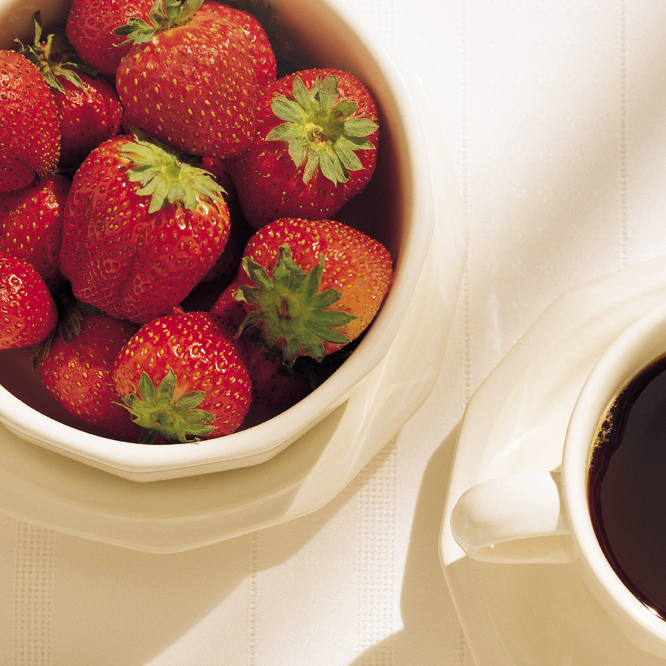

In [ ]:
color_img = Image.open('/content/drive/MyDrive/DIP3E_Original_Images_CH06/Fig0631(a)(strawberries_coffee_full_color).tif')
fig = px.imshow(color_img)
fig.show()

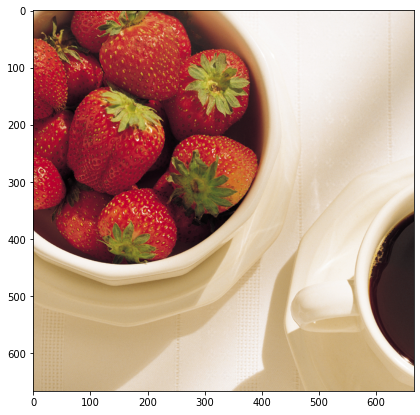

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(color_img, origin='upper')

The negation process of color images differs depending upon if the image is in RGB or HSI mode. For RGB images, the R, G, B channels are separated, then negated, then stacked on top of one another again. For HSI images, we need to negate the I channel and keep the S channel unchanged. However, for negating a value in the H channel, we need to find the hue value directly opposite to that value in the color circle. This value situated at the opposite end is known as the color complement of the initial value. We need to replace every value in the H channel with its color complement.

In [ ]:
def to_negative(image, mode):
    if mode == 'RGB':
        return 255 - image
    else:
        HSI_negative = deepcopy(image)
        HSI_negative[:,:,0] = (HSI_negative[:,:,0] + 127) % 255
        HSI_negative[:,:,2] = 255 - HSI_negative[:,:,2]
        return HSI_negative

The function takes an image and its mode as arguments and returns the negative of that image. In the case of RGB, $$g_R(x,y) = L_{max} - f_R(x,y)$$ $$g_G(x,y) = L_{max} - f_G(x,y)$$ $$g_B(x,y) = L_{max} - f_B(x,y)$$ where $L_{max}=255$ for 8-bit channels. In the case of HSI, $$g_H(x,y) = (f_H(x,y) + \lceil \frac{L_{max}}{2} \rceil) \% L_{max}$$ $$g_I(x,y) = L_{max} - f_I(x,y)$$

In [ ]:
RGB = np.array(color_img.convert(mode='RGB'))
HSI = np.array(color_img.convert(mode='HSV'))


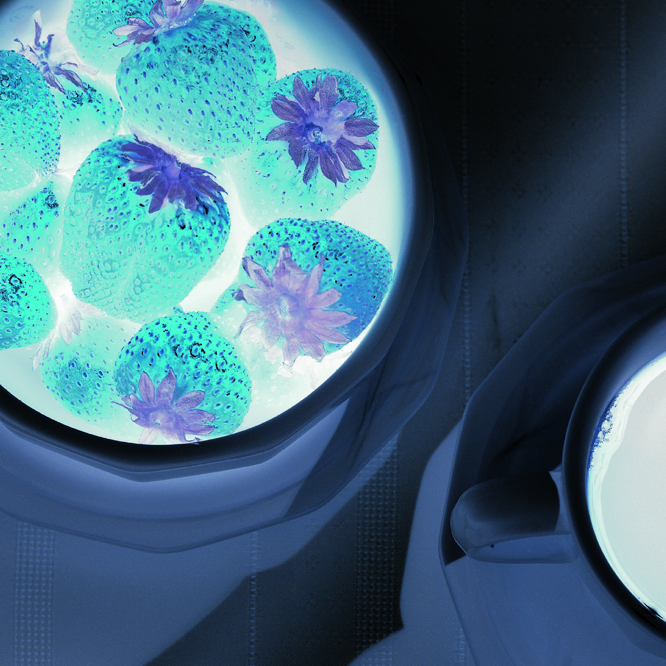

In [ ]:
RGB_negative = to_negative(RGB, mode='RGB') # 255 - RGB
fig = px.imshow(RGB_negative)
fig.show()

(-0.5, 665.5, 665.5, -0.5)

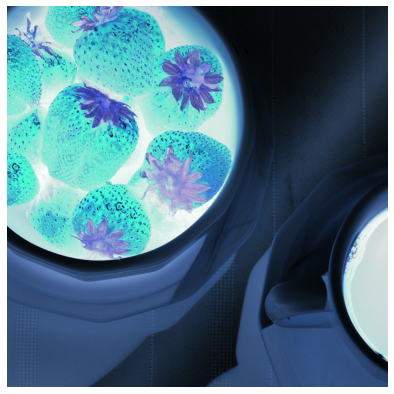

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(RGB_negative, origin='upper')
plt.axis('off')

In [ ]:
# HSI_negative = HSI
# HSI_negative[:,:,0] = (HSI_negative[:,:,0] + 127) % 255
# HSI_negative[:,:,2] = 255 - HSI_negative[:,:,2]
HSI_negative = to_negative(HSI, mode='HSI')
# HSI_negative[:,:,2] = (255 - HSI_negative[:,:,2] + 10)
# HSI_negative[:,:,2][HSI_negative[:,:,2]>255]=255

In [ ]:
def normalization(image, range=255):
     image_array = np.array(image)
     image_min = np.min(image_array)
     image_max = np.max(image_array)
     return ((image_array - image_min)/(image_max - image_min)) * range

def custom_HSI_to_RGB(hsi):
    rgb = np.zeros(hsi.shape)
    hsi = hsi/255
    rgb[:,:,1] = hsi[:,:,2] * (1 - hsi[:,:,1])
    rgb[:,:,2] = hsi[:,:,2] * (1 + ((hsi[:,:,1] * np.cos((hsi[:,:,0]) * 2 * np.pi))/(np.cos((np.pi/3) - (2 * np.pi * (hsi[:,:,0]))))))
    rgb[:,:,0] = (3 * hsi[:,:,2]) - (rgb[:,:,1] + rgb[:,:,2])
    rgb[:,:,0] = normalization(rgb[:,:,0])
    rgb[:,:,1] = normalization(rgb[:,:,1])
    rgb[:,:,2] = normalization(rgb[:,:,2])
    return rgb

In [ ]:
fig = px.imshow(custom_HSI_to_RGB(HSI_negative))
fig.show()


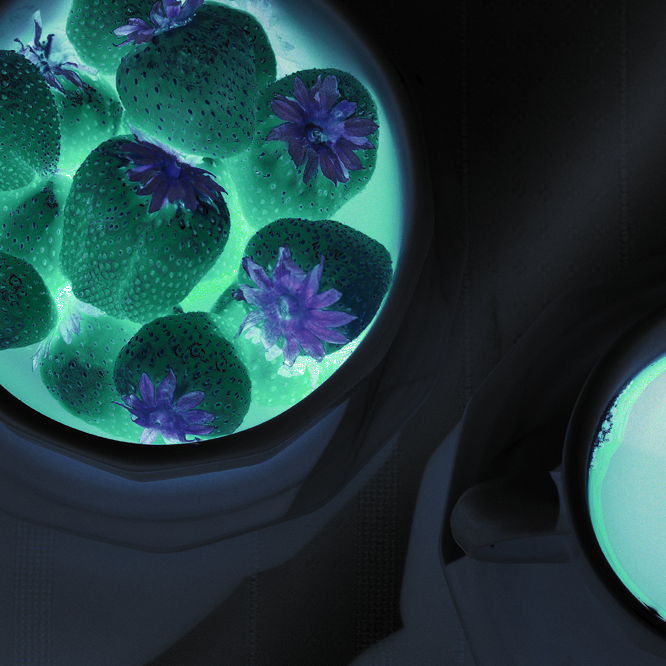

In [ ]:
fig = px.imshow(Image.fromarray(HSI_negative, mode='HSV').convert(mode='RGB'))
fig.show()

(-0.5, 665.5, 665.5, -0.5)

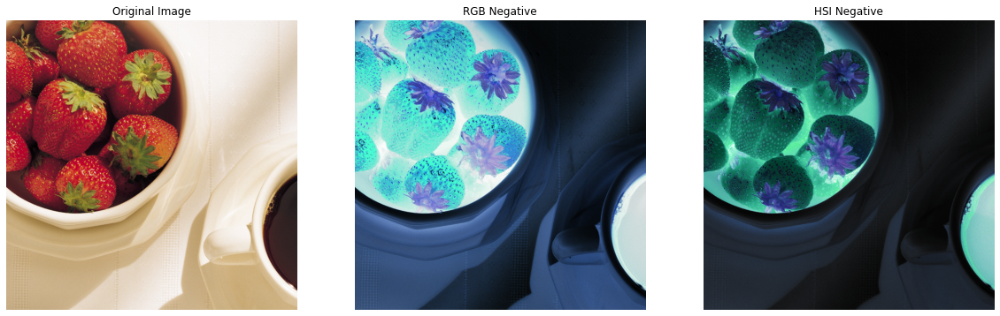

In [ ]:
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 3, 1)
plt.imshow(color_img, origin='upper')
plt.title('Original Image')
plt.axis('off')

fig.add_subplot(1, 3, 2)
plt.imshow(RGB_negative, origin='upper')
plt.title('RGB Negative')
plt.axis('off')

fig.add_subplot(1, 3, 3)
plt.imshow(Image.fromarray(HSI_negative, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('HSI Negative')
plt.axis('off')

The red portions of the original image's strawberries have been converted to a shade of cyan. The white table-top and cutlery have been negated to a black shade. The dark-brown coffee is converted to a bright white color.

**What differences are noticed between the RGB-negative and HSV-negative?**
We can clearly notice some visual differences between the RGB-negative and the HSI-negative. The HSI-negative image was displayed after being converted to RGB mode, resulting in an approximated version of the actual HSI image. Since we kept the S channel of the original image unaltered, the vividness of the negated colors remained unchanged for the HSI version. However, for the RGB version, we are bound to see a change in the vividness of the colors since all 3 channels were altered. That is why, we can see a teal shade in the HSI-negative version instead of the cyan color seen in the RGB-negative image. The complement transformation functions look something like,

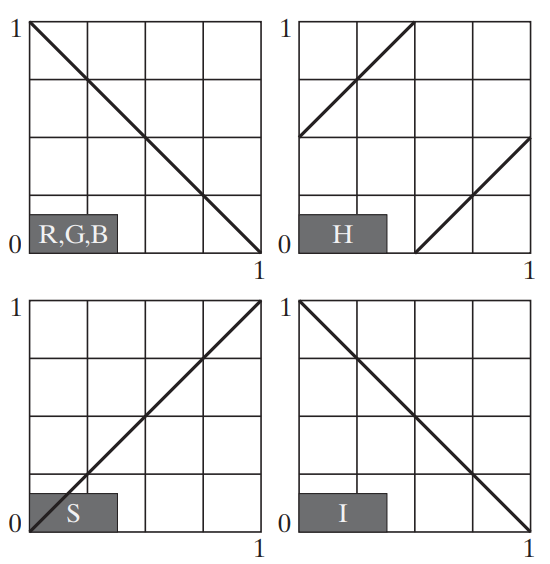

# Task 2 (Histogram Equalization)
Apply the Global HE technique on color images.


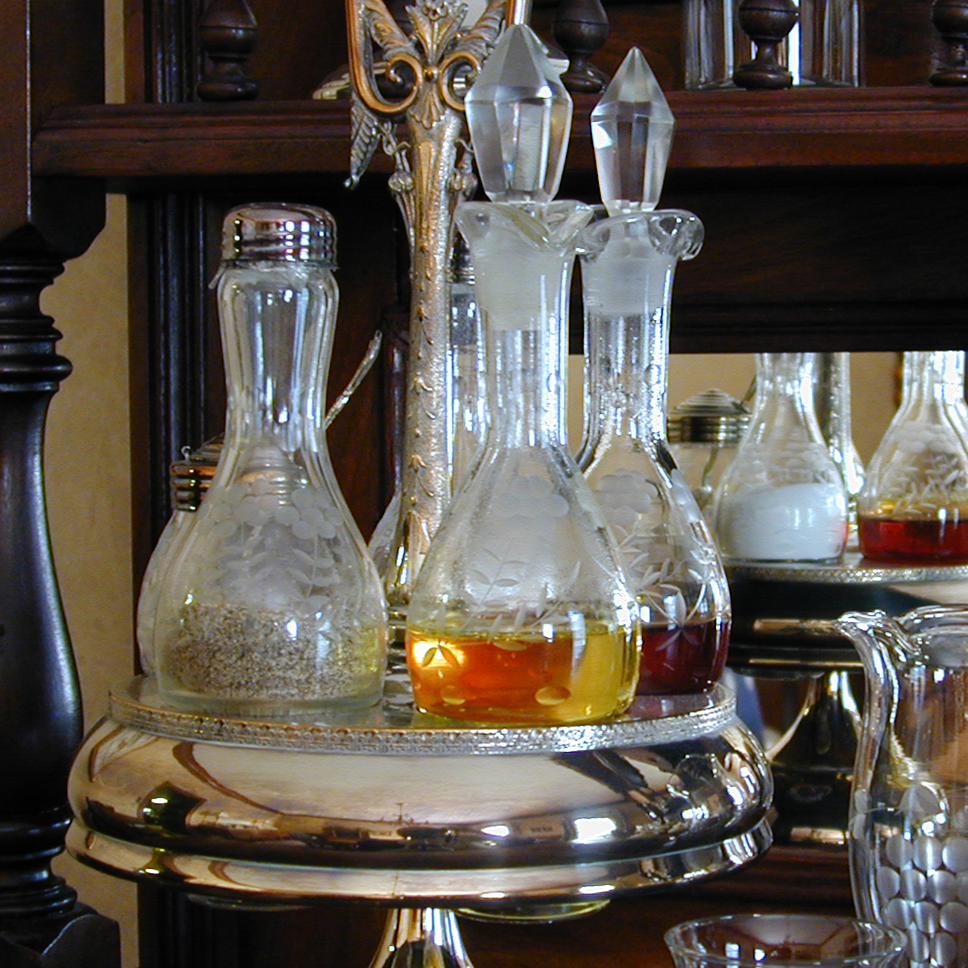

In [ ]:
color_img2 = Image.open('/content/drive/MyDrive/DIP3E_Original_Images_CH06/Fig0637(a)(caster_stand_original).tif')
fig = px.imshow(color_img2)
fig.show()

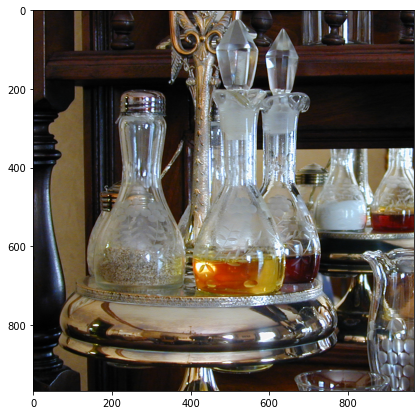

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(color_img2, origin='upper')

In [ ]:
RGB2 = np.array(color_img2.convert(mode='RGB'))
HSI2 = np.array(color_img2.convert(mode='HSV'))

Histogram equalization is yet another technique in the domain of image enhancement. The discrete form of this transformation is,
$$s_k = T(r_k) = \frac{(L-1)}{M \times N}\sum_{j=0}^{k}n_{r_j}\qquad k=0, 1, 2, \dots, L-1$$
where, $L$ is the number of possible intensity levels, $M$ is the number of rows, $N$ is the number of columns and $n_{r_j}$ is the number of pixels with intensity value $r_j$.

In [ ]:
def get_frequency_map(image):
    intensity_matrix = np.array(image)
    color, frequency = np.unique(intensity_matrix, return_counts=True)
    histogram = np.full(256, 0, 'uint64')
    histogram[color] = frequency
    return histogram

def global_histogram_equalization(image):
    frequency_map = get_frequency_map(image)
    pSum = np.cumsum(frequency_map)
    total_pixels = np.sum(frequency_map)
    cdf = pSum/total_pixels
    scaled_image = np.round(255 * cdf).astype('uint8')
    ret_image_matrix = scaled_image[image]
    # ret_image = Image.fromarray(np.uint8(ret_image_martix))
    return ret_image_matrix

For RGB images, we apply the histogram equalization process to all 3 channels. Whereas, for HSI images, we apply the process only to the I channel.

In [ ]:
RGB2_GHE = deepcopy(RGB2)
RGB2_GHE[:,:,0] = global_histogram_equalization(RGB2_GHE[:,:,0])
RGB2_GHE[:,:,1] = global_histogram_equalization(RGB2_GHE[:,:,1])
RGB2_GHE[:,:,2] = global_histogram_equalization(RGB2_GHE[:,:,2])

In [ ]:
fig = px.imshow(RGB2_GHE)
fig.show()

In [ ]:
HSI2_GHE = deepcopy(HSI2)
HSI2_GHE[:,:,2] = global_histogram_equalization(HSI2_GHE[:,:,2])

In [ ]:
fig = px.imshow(Image.fromarray(HSI2_GHE, mode='HSV').convert(mode='RGB'))
fig.show()

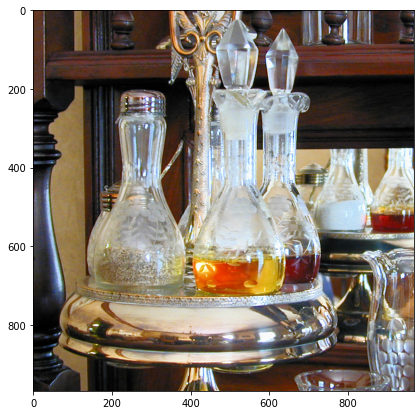

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(Image.fromarray(HSI2_GHE, mode='HSV').convert(mode='RGB'), origin='upper')

In [ ]:
HSI2_GHE2 = deepcopy(HSI2_GHE)
HSI2_GHE2[:,:,1] = HSI2_GHE2[:,:,1] + 5
HSI2_GHE2[:,:,1][HSI2_GHE2[:,:,1]>255] = 255

In [ ]:
fig = px.imshow(Image.fromarray(HSI2_GHE2, mode='HSV').convert(mode='RGB'))
fig.show()

(-0.5, 967.5, 967.5, -0.5)

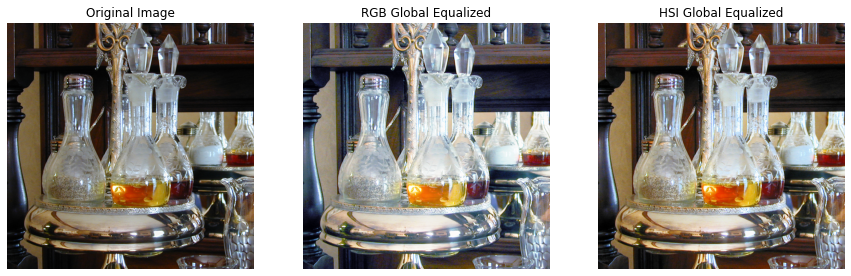

In [ ]:
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 3, 1)
plt.imshow(color_img2, origin='upper')
plt.title('Original Image')
plt.axis('off')

fig.add_subplot(1, 3, 2)
plt.imshow(RGB2_GHE, origin='upper')
plt.title('RGB Global Equalized')
plt.axis('off')

fig.add_subplot(1, 3, 3)
plt.imshow(Image.fromarray(HSI2_GHE, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('HSI Global Equalized')
plt.axis('off')

# fig.add_subplot(1, 4, 4)
# plt.imshow(Image.fromarray(HSI2_GHE2, mode='HSV').convert(mode='RGB'), origin='upper')
# plt.title('HSI Global Equalized (S offset)')
# plt.axis('off')

**Does the HE result become same for both RGB and HSV models?**
We can see significant differences between the RGB and HSI versions of the global equalized images. The RGB version appears a bit brighter in intensity whereas the colors in the HSI version are more vivid. The equalized image overall looks more detailed. We can clearly see the wood grains in the cupboard behind the glass containers. Although the H channel and the S channel were unaltered, we can see significant change in color perception in the HSI version.

# Task 3 (Linear Filter)
For sharpening we use the simplest isotropic derivative operator, which is the Laplacian operator. The general form is,
    \begin{equation}
    \begin{split}
        \nabla^2f(x,y)&=\frac{\partial^2f}{\partial x^2} + \frac{\partial^2f}{\partial y^2}\\
        &=f(x+1,y)+f(x-1,y)+f(x,y+1)+f(x,y-1)-4f(x,y)
    \end{split}
    \end{equation}
    As Laplacian is a derivative operator, it highlights sharp intensity transitions in an image and de-emphasizes regions of slowly varying intensities. This
    will tend to produce images that have grayish edge lines and other discontinuities,
    all superimposed on a dark, featureless background. Overall, the usage of Laplacian for image sharpening is,
    \begin{equation}
        g(x,y)=f(x,y)+c[\nabla^2f(x,y)]
    \end{equation}
where $f(x,y)$ and $g(x,y)$ are the input and sharpened images, respectively.


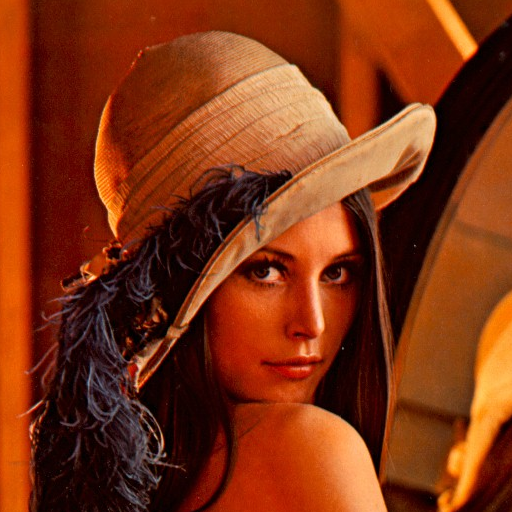

In [ ]:
color_img3 = Image.open('/content/drive/MyDrive/DIP3E_Original_Images_CH06/Fig0638(a)(lenna_RGB).tif')
fig = px.imshow(color_img3)
fig.show()

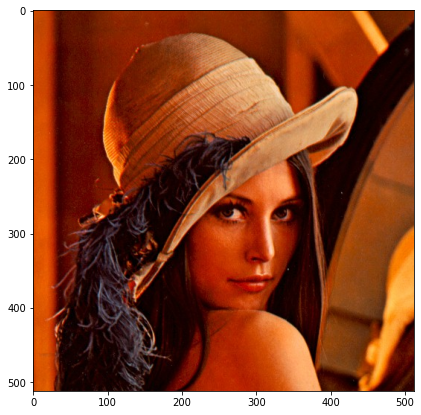

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(color_img3, origin='upper')

In [ ]:
RGB3 = np.array(color_img3.convert(mode='RGB'))
HSI3 = np.array(color_img3.convert(mode='HSV'))

Some examples of Laplacian kernels are,
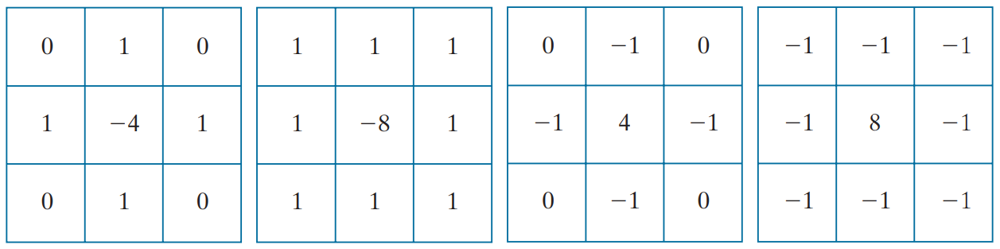

In [ ]:
filter1 = np.array([[0, 1, 0],
                    [1, -4, 1],
                    [0, 1, 0]])

filter2 = np.array([[1, 1, 1],
                    [1, -8, 1],
                    [1, 1, 1]])

filter3 = -filter1
filter4 = -filter2

In [ ]:
def normalization(image, range=255):
     image_array = np.array(image)
     image_min = np.min(image_array)
     image_max = np.max(image_array)
     return Image.fromarray(np.uint8(((image_array - image_min)/(image_max - image_min)) * range))

def laplacian_sharpening(image, filter, c=1):
    image_array = np.array(image)
    M, N = image_array.shape
    m = filter.shape[0]
    padding_dimensions = (M + m - 1, N + m - 1)
    image_originX, image_originY = (m//2, m//2)
    padded_image = np.zeros(padding_dimensions)
    padded_image[image_originX:image_originX + M, image_originY:image_originY + N] = image_array
    unscaled_response = np.zeros(image_array.shape)
    for i in range(0, M):
        for j in range(0, N):
            unscaled_response[i, j] = np.sum(padded_image[i:i + m, j:j + m] * filter)
    scaled_response = normalization(unscaled_response)
    factored_image = c * unscaled_response
    sharpened_image = factored_image + image_array
    sharpened_image[sharpened_image > 255] = 255
    sharpened_image[sharpened_image < 0] = 0
    return unscaled_response, scaled_response, sharpened_image

Let's use the 3rd kernel to sharpen the image shown above.

For sharpening the RGB version of the image, we apply the Laplacian sharpening process on all 3 channels. Whereas, for the HSI mode, the sharpening is only done on the I channel. 

In [ ]:
RGB3_sharpened = deepcopy(RGB3)
RGB3_sharpened[:,:,0] = laplacian_sharpening(RGB3_sharpened[:,:,0], filter=filter3)[2]
RGB3_sharpened[:,:,1] = laplacian_sharpening(RGB3_sharpened[:,:,1], filter=filter3)[2]
RGB3_sharpened[:,:,2] = laplacian_sharpening(RGB3_sharpened[:,:,2], filter=filter3)[2]


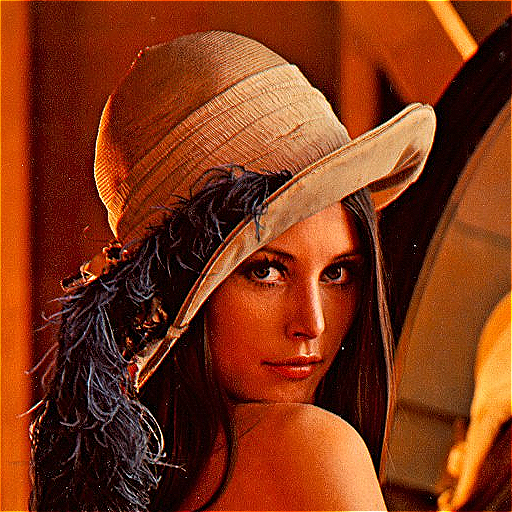

In [ ]:
fig = px.imshow(RGB3_sharpened)
fig.show()

In [ ]:
HSI3_sharpened = deepcopy(HSI3)
HSI3_sharpened[:,:,2] = laplacian_sharpening(HSI3_sharpened[:,:,2], filter=filter3)[2]


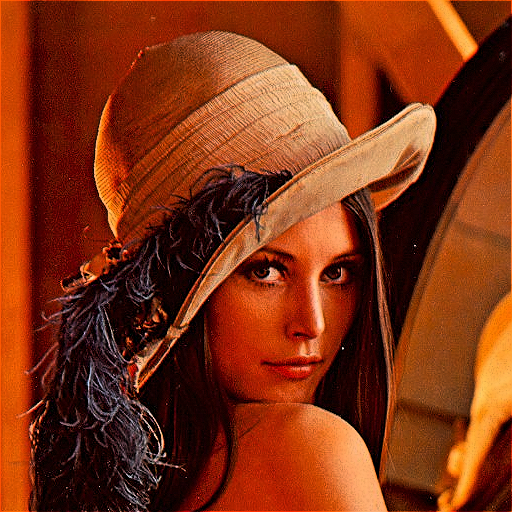

In [ ]:
fig = px.imshow(Image.fromarray(HSI3_sharpened, mode='HSV').convert(mode='RGB'))
fig.show()

In [ ]:
diff_sharpened = deepcopy(np.array(Image.fromarray(HSI3_sharpened, mode='HSV').convert(mode='RGB')) - RGB3_sharpened)
diff_sharpened_1D = np.absolute(diff_sharpened) # np.zeros((diff_sharpened.shape[0],diff_sharpened.shape[1]))
diff_sharpened_1D2 = np.zeros((diff_sharpened.shape[0],diff_sharpened.shape[1]))
for i in range(0, 512):
    for j in range(0, 512):
        diff_sharpened_1D2[i, j] = np.sum(diff_sharpened_1D[i,j])# np.floor(np.linalg.norm(diff_sharpened[i,j])) # (abs(diff_sharpened[i,j,0]) + abs(diff_sharpened[i,j,1]) + abs(diff_sharpened[i,j,2]))

In [ ]:
diff_sharpened_1D2.shape

(512, 512)

In [ ]:
diff_sharpened_1D_normalized = normalization(diff_sharpened_1D2)

In [ ]:
# fig = px.imshow(diff_sharpened, color_continuous_scale='gray')
fig = px.imshow(diff_sharpened_1D_normalized, color_continuous_scale='gray')
fig.show()

(-0.5, 511.5, 511.5, -0.5)

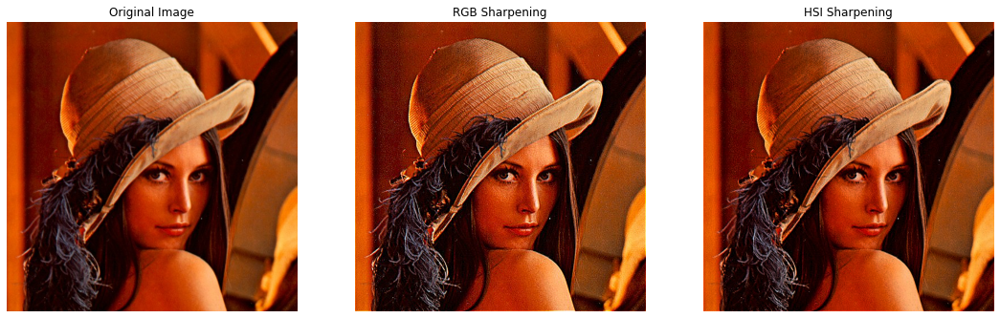

In [ ]:
fig = plt.figure(figsize=(25, 25))
fig.add_subplot(1, 4, 1)
plt.imshow(color_img3, origin='upper')
plt.title('Original Image')
plt.axis('off')

fig.add_subplot(1, 4, 2)
plt.imshow(RGB3_sharpened, origin='upper')
plt.title('RGB Sharpening')
plt.axis('off')

fig.add_subplot(1, 4, 3)
plt.imshow(Image.fromarray(HSI3_sharpened, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('HSI Sharpening')
plt.axis('off')

# fig.add_subplot(1, 4, 4)
# plt.imshow(diff_sharpened_1D_normalized, origin='upper', cmap='gray')
# plt.title('Difference')
# plt.axis('off')

There are very slight differences that are noticeable between the 2 sharpened images, but they look more or less the same. Any slight discrepancy is because of the alteration of I channel only in the case of HSI and alteration of all 3 channels in the case of RGB.

# Task 4 (Non-Linear Filter)

*   Add 'salt & pepper' noise to individual channels of an image (you can use any built-in function or design your own function).
*   Apply the median filter on color images to reduce noise.

Salt and pepper noise is a type of noise commonly seen in digital images. Generally, the images have a sparsely occurring manifestation of black and white pixels. Since, the white pixels look like salt, and the black pixels look like pepper, this type of noise is dubbed as Salt and Pepper Noise. This type of noise is generally implemented using some sort of probability distribution. For a given probability value $p$,
    \begin{equation}
        f(x,y)=
        \begin{cases}
            f(x,y),\text{ with probability }1-p\\
            0,\text{ with probability }\frac{p}{2}\\
            255,\text{ with probability }\frac{p}{2}
        \end{cases}
    \end{equation}
The higher the probability parameter $p$ is set, the greater the density of noise we see in the output image.

In [ ]:
import random
def custom_salt_and_pepper_noise(image, probability=0.05):
    image_array = np.array(image)
    M, N = image_array.shape
    random_image_array = np.random.choice(
        [0,1,np.nan],p=[probability/2, 1 - probability, probability/2], size=(M, N)
    )
    image_array = image_array.astype('float') * random_image_array
    # print(random_image_array)
    for i in range(0, M):
        for j in range(0, N):
            image_array[i, j] = image_array[i, j].astype('float') * random_image_array[i, j]
    image_array = np.nan_to_num(image_array, nan=255).astype('uint8')
    return image_array

Let's try it out on all 3 channels of the RGB version of the image shown above and see how it works.

In [ ]:
noisy_color_img3 = np.array(color_img3)
noisy_color_img3[:,:,0] = custom_salt_and_pepper_noise(noisy_color_img3[:,:,0])
noisy_color_img3[:,:,1] = custom_salt_and_pepper_noise(noisy_color_img3[:,:,1])
noisy_color_img3[:,:,2] = custom_salt_and_pepper_noise(noisy_color_img3[:,:,2])


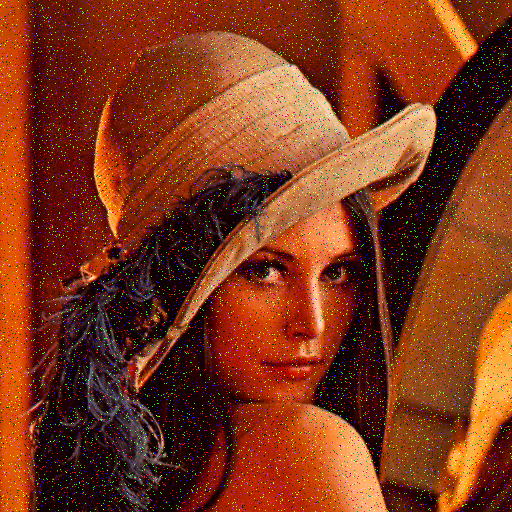

In [ ]:
fig = px.imshow(noisy_color_img3)
fig.show()

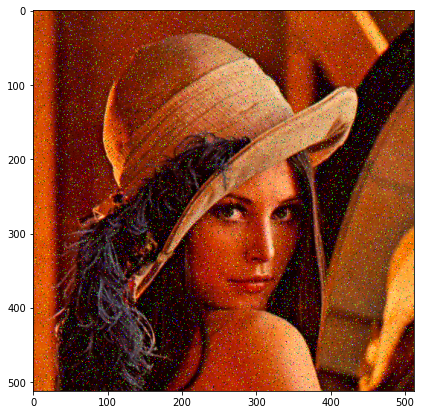

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(noisy_color_img3, origin='upper')

The median filter uses the median of a neighborhood of pixel intensity values and replaces the central pixel's value with that median.

In [ ]:
def median_noise_reduction(image, m=3):
    image_array = np.array(image)
    M, N = image_array.shape
    padding_dimensions = (M + m - 1, N + m - 1)
    image_originX, image_originY = (m//2, m//2)
    padded_image = np.zeros(padding_dimensions)
    padded_image[image_originX:image_originX + M,image_originY:image_originY + N] = image_array
    smoothed_image_array = np.zeros(image_array.shape)
    for i in range(0, M):
        for j in range(0, N):
            smoothed_image_array[i, j] = np.median(padded_image[i:i + m, j:j + m])
    return smoothed_image_array

Now, let's apply it on all 3 channels of the noisy RGB image shown above.

In [ ]:
median_noise_reduced_color_img31 = deepcopy(noisy_color_img3)
median_noise_reduced_color_img31[:,:,0] = median_noise_reduction(median_noise_reduced_color_img31[:,:,0], m=3)
median_noise_reduced_color_img31[:,:,1] = median_noise_reduction(median_noise_reduced_color_img31[:,:,1], m=3)
median_noise_reduced_color_img31[:,:,2] = median_noise_reduction(median_noise_reduced_color_img31[:,:,2], m=3)

median_noise_reduced_color_img32 = deepcopy(noisy_color_img3)
median_noise_reduced_color_img32[:,:,0] = median_noise_reduction(median_noise_reduced_color_img32[:,:,0], m=5)
median_noise_reduced_color_img32[:,:,1] = median_noise_reduction(median_noise_reduced_color_img32[:,:,1], m=5)
median_noise_reduced_color_img32[:,:,2] = median_noise_reduction(median_noise_reduced_color_img32[:,:,2], m=5)


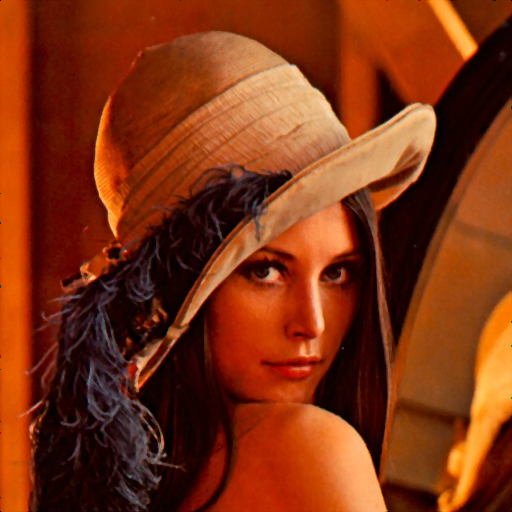

In [ ]:
fig = px.imshow(median_noise_reduced_color_img31)
fig.show()


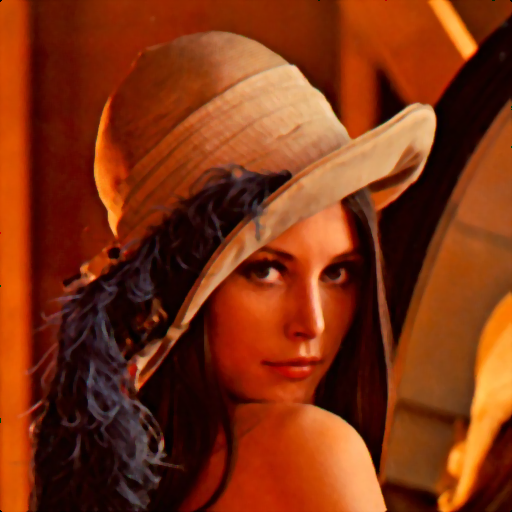

In [ ]:
fig = px.imshow(median_noise_reduced_color_img32)
fig.show()

Now, let's apply it only on the I channel of the HSI version of the image.

In [ ]:
noisy_color_img3_HSI = deepcopy(HSI3)
noisy_color_img3_HSI[:,:,2] = custom_salt_and_pepper_noise(noisy_color_img3_HSI[:,:,2])
noisy_color_img3_HSI123 = noisy_color_img3_HSI


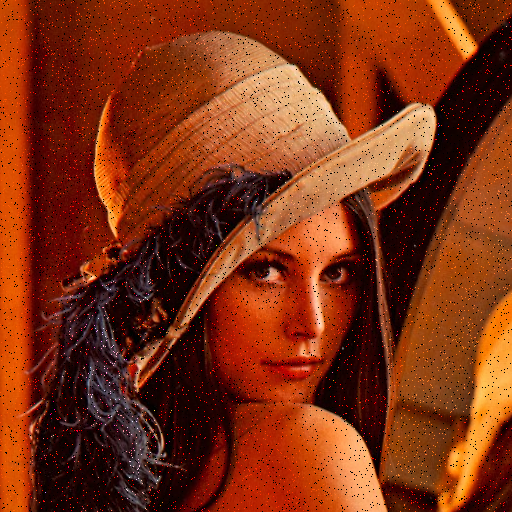

In [ ]:
fig = px.imshow(Image.fromarray(noisy_color_img3_HSI, mode='HSV').convert(mode='RGB'))
fig.show()

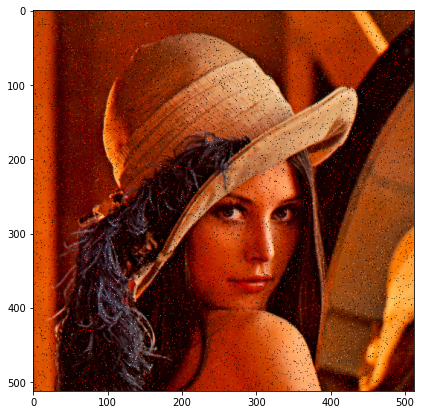

In [ ]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(Image.fromarray(noisy_color_img3_HSI, mode='HSV').convert(mode='RGB'), origin='upper')

The probability value $p$ was set to a default of 0.05 for both of the images shown above.

Again, let's do the same thing for the I channel in the noisy HSI image shown above.

In [ ]:
median_noise_reduced_color_img31_HSI = deepcopy(noisy_color_img3_HSI)
median_noise_reduced_color_img31_HSI[:,:,2] = median_noise_reduction(median_noise_reduced_color_img31_HSI[:,:,2], m=3)

median_noise_reduced_color_img32_HSI = deepcopy(noisy_color_img3_HSI)
median_noise_reduced_color_img32_HSI[:,:,2] = median_noise_reduction(median_noise_reduced_color_img32_HSI[:,:,2], m=5)


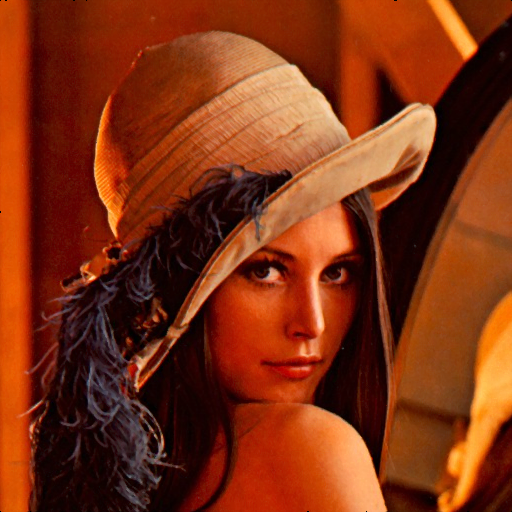

In [ ]:
fig = px.imshow(Image.fromarray(median_noise_reduced_color_img31_HSI, mode='HSV').convert(mode='RGB'))
fig.show()


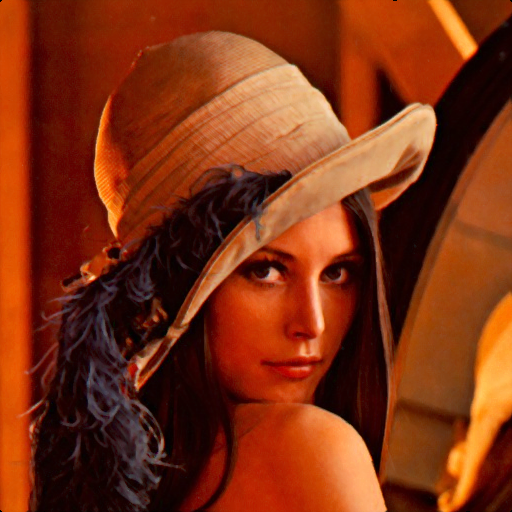

In [ ]:
fig = px.imshow(Image.fromarray(median_noise_reduced_color_img32_HSI, mode='HSV').convert(mode='RGB'))
fig.show()

(-0.5, 511.5, 511.5, -0.5)

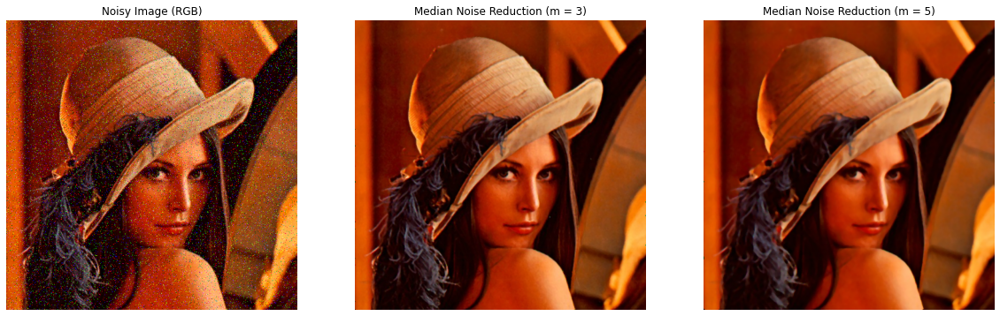

In [ ]:
fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 3, 1)
plt.imshow(noisy_color_img3, origin='upper')
plt.title('Noisy Image (RGB)')
plt.axis('off')

fig.add_subplot(1, 3, 2)
plt.imshow(median_noise_reduced_color_img31, origin='upper')
plt.title('Median Noise Reduction (m = 3)')
plt.axis('off')

fig.add_subplot(1, 3, 3)
plt.imshow(median_noise_reduced_color_img32, origin='upper')
plt.title('Median Noise Reduction (m = 5)')
plt.axis('off')

(-0.5, 511.5, 511.5, -0.5)

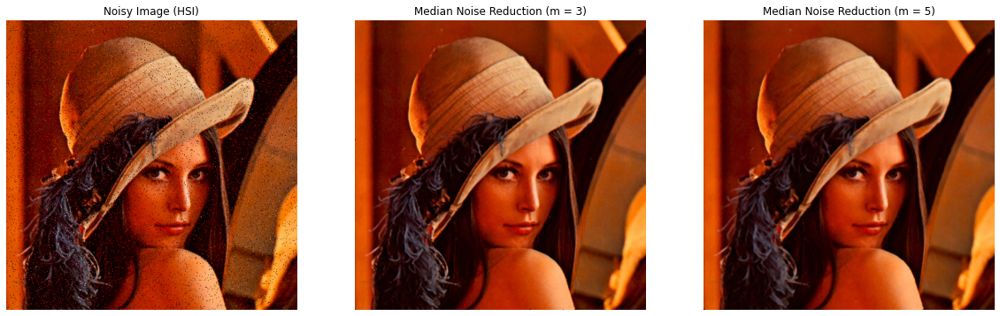

In [ ]:
fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 3, 1)
plt.imshow(Image.fromarray(noisy_color_img3_HSI, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('Noisy Image (HSI)')
plt.axis('off')

fig.add_subplot(1, 3, 2)
plt.imshow(Image.fromarray(median_noise_reduced_color_img31_HSI, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('Median Noise Reduction (m = 3)')
plt.axis('off')

fig.add_subplot(1, 3, 3)
plt.imshow(Image.fromarray(median_noise_reduced_color_img32_HSI, mode='HSV').convert(mode='RGB'), origin='upper')
plt.title('Median Noise Reduction (m = 5)')
plt.axis('off')

As we can observe from the resultant images shown above, median filter yields excellent results for the corrupted images, especially the $5\times5$ filter. Median filters are quite popular for remedying certain types of random noise like salt and pepper noise because they provide excellent noise reduction capabilities with considerably less blurring than linear smoothing filters of similar size. We can achieve even better outputs if we perform multiple passes on an image with a median filter.